# Assignment 3 - Semantic Segmentation
### Syed Saad Ullah Shah
### 400202
### MSDS - CV
<hr >

## 1): Importing Packages

In [109]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

from PIL import Image
import cv2
import albumentations as A

import time
import os
from tqdm.notebook import tqdm
!pip install -q torchsummary

from torchsummary import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## 2): Dataset Preprocessing

### Cityspace Dataset

The dataset is a subset of Cityspace Dataset and is already divided into train and test splits.
For validation, you can further split the Train part such that 80% is used for training and 20%
for validation.
Following classes are there in the dataset.
"Sky", "Building", "Pole","Road","Pavement","Tree","SignSymbol", "Fence", "Car",
"Pedestrian", "Bicyclist"

In [110]:
# Downloading dataset
!gdown https://drive.google.com/file/d/1-9KNRTrsjQetmwT4Kamx391YEwkC43ue/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1-9KNRTrsjQetmwT4Kamx391YEwkC43ue
To: /content/A3_Dataset.zip
100% 126M/126M [00:00<00:00, 141MB/s]


In [111]:
# Unzipping downloaded dataset
!unzip /content/A3_Dataset.zip

Archive:  /content/A3_Dataset.zip
replace A3_Dataset/dataset1/annotations_prepped_test/0016E5_07959.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [112]:
# Defining paths to dataset
MASK_PATH = "/content/A3_Dataset/dataset1/annotations_prepped_train/"
IMAGE_PATH = "/content/A3_Dataset/dataset1/images_prepped_train/"
MASK_PATH_TEST = "/content/A3_Dataset/dataset1/annotations_prepped_test/"
IMAGE_PATH_TEST = "/content/A3_Dataset/dataset1/images_prepped_test/"

In [113]:
# Counting total Training images
n_classes = 12
name = []
def create_df():
    #name = []
    for dirname, _, filenames in os.walk(IMAGE_PATH):
        for filename in filenames:
            name.append(filename.split('.')[0])

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df()
print('Total Images: ', len(df))

Total Images:  367


In [114]:
# Counting total Testing images
n_classes = 12
name = []
def create_df():
    #name = []
    for dirname, _, filenames in os.walk(IMAGE_PATH_TEST):
        for filename in filenames:
            name.append(filename.split('.')[0])

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df_test = create_df()
print('Total Images: ', len(df_test))

Total Images:  101


In [115]:
# Splitting dataset into Training, Validation and Testing setsS
X_test = df_test['id'].values
X_train, X_val = train_test_split(df['id'].values, test_size=0.15, random_state=19)

print('Train Size   : ', len(X_train))
print('Val Size     : ', len(X_val))
print('Test Size    : ', len(X_test))

Train Size   :  311
Val Size     :  56
Test Size    :  101


In [116]:
import matplotlib
print(matplotlib.rcParams['image.cmap'])

viridis


Image Size (360, 480, 3)
Mask Size (360, 480)


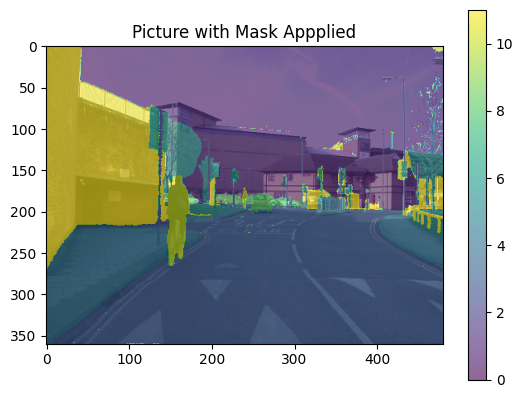

In [117]:
# Viewing an example image from dataset
img = Image.open(IMAGE_PATH + '/' + df['id'][101] + '.png')
mask = Image.open(MASK_PATH + '/' + df['id'][101] + '.png')
print('Image Size', np.asarray(img).shape)
print('Mask Size', np.asarray(mask).shape)

plt.imshow(img, cmap = 'viridis')
msk = plt.imshow(mask, alpha=0.6, cmap ='viridis')
plt.title('Picture with Mask Appplied')
#plt.show()

# Add a colorbar to show the mapping between colors and data values
plt.colorbar(msk)

# Show the plot
plt.show()

In [118]:
# Defining class for given dataset
from torchvision import transforms as T

class CityDataset(Dataset):
    
    def __init__(self, img_path, mask_path, X, mean, std, transform=None):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform
        self.mean = mean
        self.std = std

    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)
        
        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']
        
        if self.transform is None:
            img = Image.fromarray(img)
        
        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        mask = torch.from_numpy(mask).long()
            
        return img, mask

In [119]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

# Augmenting items in the dataset

# Here i am resizing, rotating and removing noise form dataset
t_train = A.Compose([A.Resize(256, 256, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(),
                     A.GaussNoise()])

# Here i am interpolating the dataset
t_val = A.Compose([A.Resize(256, 256, interpolation=cv2.INTER_NEAREST)])

# datasets
train_set = CityDataset(IMAGE_PATH, MASK_PATH, X_train, mean, std, t_train)
val_set = CityDataset(IMAGE_PATH, MASK_PATH, X_val, mean, std, t_val)

# dataloader
batch_size= 8

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=True)

## Defining Model Architecture

#**Task 1: UNet Architecture with VGG11 Backbone**

### UNet

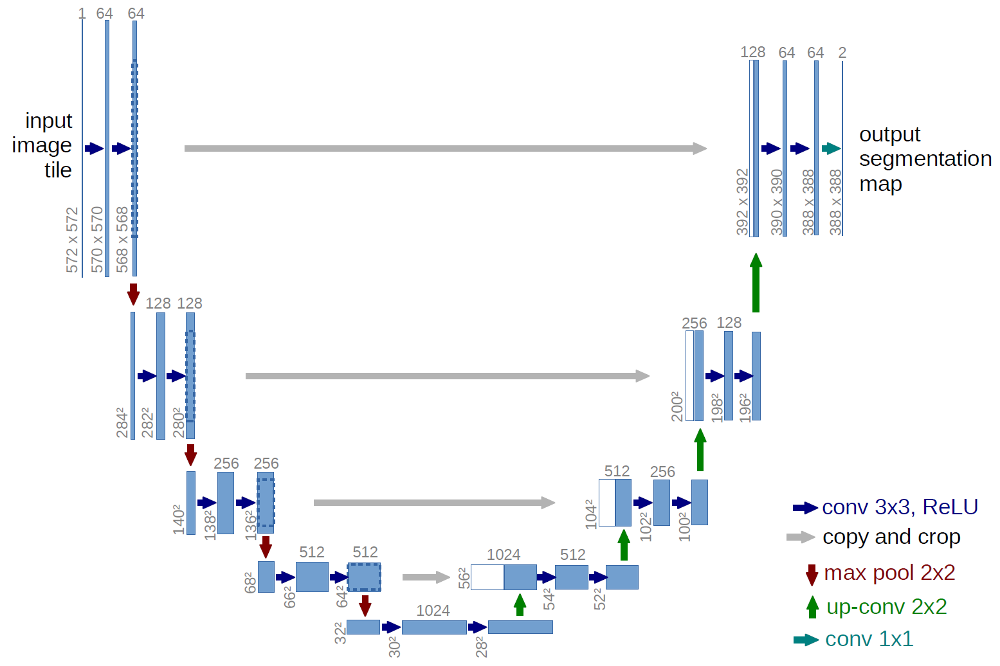

In [ ]:
!pip install -q segmentation-models-pytorch

In [ ]:
import segmentation_models_pytorch as smp

model = smp.Unet('vgg11', encoder_weights='imagenet', classes=12, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

In [ ]:
# Calculate pixel accuracy over a batch of images
def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy

In [ ]:
# Calculate mean Intersection-over-Union over a batch of images
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=5):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

## Training Model Architecture

In [ ]:
# Inner loop for running the model for 1 epoch over a given loader
def run_1_epoch(model, loss_fn, loader, optimizer = None, train = False):
  
  if train:
    model.train()
  else:
    model.eval()

  total_correct_preds = 0
  
  total_loss = 0

  # Number of images we can get by the loader
  total_samples_in_loader = len(loader.dataset)
  
  # number of batches we can get by the loader 
  total_batches_in_loader = len(loader)

  for image_batch, labels in tqdm(loader):
    
    # Transfer image_batch to GPU if available
    image_batch = image_batch.to(device)
    labels = labels.to(device)
    
    # Zeroing out the gradients for parameters
    if train:
      assert optimizer is not None, "Optimizer must be provided if train=True"
      optimizer.zero_grad()
    
    # Forward pass on the input batch
    output = model(image_batch)

    # Acquire predicted class indices
    _, predicted = torch.max(output.data, 1) # the dimension 1 corresponds to max along the rows 
    
    # Removing extra last dimension from output tensor
    #output.squeeze_(-1)

    # Compute the loss for the minibatch
    loss = loss_function(output, labels)
    
    # Backpropagation
    if train:
      loss.backward()
    
    # Update the parameters using the gradients
    if train:
      optimizer.step()
    
    # Extra variables for calculating loss and accuracy
    # count total predictions for accuracy calcutuon for this epoch
    #total_correct_preds += (predicted == labels).sum().item()

    total_loss += loss.item()

  loss = total_loss / total_batches_in_loader
  accuracy = pixel_accuracy(output, labels)
  mean_IoU = mIoU(output, labels)

  return loss, accuracy, mean_IoU

### Training Configuration

In [ ]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Define the learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Set the number of epochs
# This variable is used in the main training loop
epochs = 100

model.to(device);

In [ ]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracies = []
val_accuracies = []

train_losses = []
val_losses = []

train_mIoUs = []
val_mIoUs = []

val_mIoU_max = -1

checkpoint_path = '/content/Pre-Trained_Models/checkpoint_norm_aug_tensorboard.pth'
best_val_checkpoint_path = '/content/Pre-Trained_Models/best_val_checkpoint_norm_aug_tensorboard.pth'

# Start epoch is zero for new training
start_epoch = 0

In [ ]:
!mkdir Pre-Trained_Models

mkdir: cannot create directory ‘Pre-Trained_Models’: File exists


### Main training loop

In [ ]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch

  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy, train_mIoU  = run_1_epoch(model, loss_function, train_loader, optimizer, train= True)

  # Update the learning rate scheduler
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_losses.append(train_loss)
  train_accuracies.append(train_accuracy)
  train_mIoUs.append(train_mIoU)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy, val_mIoU  = run_1_epoch(model, loss_function, val_loader, optimizer, train= False)
  
  # Lists for val loss and accuracy for plotting
  val_losses.append(val_loss)
  val_accuracies.append(val_accuracy)
  val_mIoUs.append(val_mIoU)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  # writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  # writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))
  print('train_IoU %.2f'%(train_mIoU))
  print('val_IoU %.2f'%(val_mIoU))
  
  # Save model if validation accuracy for current epoch is greater than 
  # all the previous epochs 
  if val_mIoU > val_mIoU_max:
    val_mIoU_max = val_mIoU
    print("New max val mean IoU Acheived %.2f. Saving model.\n\n"%(val_mIoU_max))

    checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint, best_val_checkpoint_path)

  else:
    print("val mean IoU did not increase from %.2f\n\n"%(val_mIoU_max))

  # Save checkpoint for the last epoch
  checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint, checkpoint_path)

  

Epoch 0: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 0: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 1.2176
val loss: 0.7946
train_accuracy 0.81
val_accuracy 0.80
train_IoU 0.48
val_IoU 0.46
New max val mean IoU Acheived 0.46. Saving model.


Epoch 1: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.7005
val loss: 0.7097
train_accuracy 0.85
val_accuracy 0.74
train_IoU 0.57
val_IoU 0.51
New max val mean IoU Acheived 0.51. Saving model.


Epoch 2: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.6057
val loss: 0.6595
train_accuracy 0.82
val_accuracy 0.79
train_IoU 0.55
val_IoU 0.58
New max val mean IoU Acheived 0.58. Saving model.


Epoch 3: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5597
val loss: 0.5906
train_accuracy 0.80
val_accuracy 0.77
train_IoU 0.54
val_IoU 0.56
val mean IoU did not increase from 0.58


Epoch 4: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5213
val loss: 0.5372
train_accuracy 0.84
val_accuracy 0.81
train_IoU 0.64
val_IoU 0.56
val mean IoU did not increase from 0.58


Epoch 5: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4883
val loss: 0.4934
train_accuracy 0.84
val_accuracy 0.86
train_IoU 0.61
val_IoU 0.62
New max val mean IoU Acheived 0.62. Saving model.


Epoch 6: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4657
val loss: 0.4939
train_accuracy 0.89
val_accuracy 0.84
train_IoU 0.66
val_IoU 0.62
val mean IoU did not increase from 0.62


Epoch 7: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4435
val loss: 0.4483
train_accuracy 0.87
val_accuracy 0.85
train_IoU 0.65
val_IoU 0.64
New max val mean IoU Acheived 0.64. Saving model.


Epoch 8: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4266
val loss: 0.4318
train_accuracy 0.84
val_accuracy 0.87
train_IoU 0.63
val_IoU 0.67
New max val mean IoU Acheived 0.67. Saving model.


Epoch 9: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4015
val loss: 0.4300
train_accuracy 0.87
val_accuracy 0.86
train_IoU 0.67
val_IoU 0.68
New max val mean IoU Acheived 0.68. Saving model.


Epoch 10: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3613
val loss: 0.3894
train_accuracy 0.92
val_accuracy 0.88
train_IoU 0.72
val_IoU 0.67
val mean IoU did not increase from 0.68


Epoch 11: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3460
val loss: 0.3851
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.68
New max val mean IoU Acheived 0.68. Saving model.


Epoch 12: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3397
val loss: 0.3786
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.68


Epoch 13: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3336
val loss: 0.3731
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 14: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3318
val loss: 0.3687
train_accuracy 0.85
val_accuracy 0.84
train_IoU 0.63
val_IoU 0.64
val mean IoU did not increase from 0.70


Epoch 15: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3242
val loss: 0.3707
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 16: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3193
val loss: 0.3681
train_accuracy 0.93
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 17: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3170
val loss: 0.3662
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.69
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 18: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3149
val loss: 0.3610
train_accuracy 0.91
val_accuracy 0.92
train_IoU 0.69
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 19: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3072
val loss: 0.3584
train_accuracy 0.91
val_accuracy 0.92
train_IoU 0.73
val_IoU 0.71
val mean IoU did not increase from 0.71


Epoch 20: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3040
val loss: 0.3555
train_accuracy 0.93
val_accuracy 0.89
train_IoU 0.73
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 21: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 21: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2999
val loss: 0.3558
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 22: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 22: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3000
val loss: 0.3539
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.71
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 23: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 23: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3014
val loss: 0.3541
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.71
val mean IoU did not increase from 0.71


Epoch 24: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 24: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3003
val loss: 0.3526
train_accuracy 0.93
val_accuracy 0.90
train_IoU 0.73
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 25: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 25: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2982
val loss: 0.3541
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.72
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 26: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 26: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3008
val loss: 0.3554
train_accuracy 0.88
val_accuracy 0.91
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 27: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 27: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2988
val loss: 0.3580
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 28: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 28: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2984
val loss: 0.3524
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.71
val mean IoU did not increase from 0.71


Epoch 29: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 29: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3003
val loss: 0.3529
train_accuracy 0.92
val_accuracy 0.91
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 30: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 30: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2979
val loss: 0.3535
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 31: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 31: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2977
val loss: 0.3517
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.73
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 32: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 32: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2979
val loss: 0.3534
train_accuracy 0.88
val_accuracy 0.92
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 33: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 33: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2975
val loss: 0.3523
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.72
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 34: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 34: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2977
val loss: 0.3527
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 35: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 35: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2994
val loss: 0.3524
train_accuracy 0.93
val_accuracy 0.91
train_IoU 0.71
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 36: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 36: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2971
val loss: 0.3533
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.65
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 37: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 37: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2964
val loss: 0.3511
train_accuracy 0.91
val_accuracy 0.86
train_IoU 0.71
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 38: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 38: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2979
val loss: 0.3535
train_accuracy 0.90
val_accuracy 0.92
train_IoU 0.69
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 39: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 39: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2945
val loss: 0.3514
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 40: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 40: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2968
val loss: 0.3519
train_accuracy 0.92
val_accuracy 0.91
train_IoU 0.71
val_IoU 0.71
val mean IoU did not increase from 0.71


Epoch 41: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 41: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2980
val loss: 0.3540
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 42: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 42: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2956
val loss: 0.3509
train_accuracy 0.93
val_accuracy 0.89
train_IoU 0.73
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 43: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 43: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2972
val loss: 0.3513
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.67
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 44: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 44: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2962
val loss: 0.3514
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 45: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 45: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2949
val loss: 0.3519
train_accuracy 0.89
val_accuracy 0.85
train_IoU 0.68
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 46: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 46: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2991
val loss: 0.3519
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.70
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 47: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 47: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2967
val loss: 0.3511
train_accuracy 0.92
val_accuracy 0.92
train_IoU 0.73
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 48: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 48: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2974
val loss: 0.3528
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 49: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 49: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2970
val loss: 0.3520
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 50: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 50: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2977
val loss: 0.3512
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 51: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 51: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2962
val loss: 0.3511
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.66
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 52: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 52: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2969
val loss: 0.3526
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 53: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 53: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2974
val loss: 0.3519
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 54: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 54: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2952
val loss: 0.3513
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 55: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 55: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2990
val loss: 0.3508
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 56: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 56: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3023
val loss: 0.3520
train_accuracy 0.93
val_accuracy 0.87
train_IoU 0.73
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 57: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 57: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2947
val loss: 0.3519
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 58: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 58: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2968
val loss: 0.3510
train_accuracy 0.93
val_accuracy 0.87
train_IoU 0.72
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 59: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 59: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2971
val loss: 0.3516
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.63
val mean IoU did not increase from 0.71


Epoch 60: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 60: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2949
val loss: 0.3517
train_accuracy 0.94
val_accuracy 0.91
train_IoU 0.74
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 61: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 61: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2969
val loss: 0.3529
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 62: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 62: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3004
val loss: 0.3513
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 63: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 63: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2964
val loss: 0.3521
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 64: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 64: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2954
val loss: 0.3516
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 65: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 65: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2954
val loss: 0.3512
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 66: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 66: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2966
val loss: 0.3516
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 67: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 67: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2995
val loss: 0.3524
train_accuracy 0.93
val_accuracy 0.89
train_IoU 0.72
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 68: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 68: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2970
val loss: 0.3508
train_accuracy 0.93
val_accuracy 0.90
train_IoU 0.74
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 69: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 69: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2992
val loss: 0.3512
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 70: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 70: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2960
val loss: 0.3523
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.73
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 71: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 71: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2954
val loss: 0.3521
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 72: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 72: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2968
val loss: 0.3518
train_accuracy 0.90
val_accuracy 0.86
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 73: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 73: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2967
val loss: 0.3520
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.72
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 74: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 74: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2993
val loss: 0.3529
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.72
New max val mean IoU Acheived 0.72. Saving model.


Epoch 75: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 75: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2961
val loss: 0.3514
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.72
val_IoU 0.68
val mean IoU did not increase from 0.72


Epoch 76: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 76: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2981
val loss: 0.3516
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.73
val_IoU 0.70
val mean IoU did not increase from 0.72


Epoch 77: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 77: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2986
val loss: 0.3541
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.72


Epoch 78: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 78: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2979
val loss: 0.3525
train_accuracy 0.92
val_accuracy 0.91
train_IoU 0.66
val_IoU 0.67
val mean IoU did not increase from 0.72


Epoch 79: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 79: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2972
val loss: 0.3520
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.72


Epoch 80: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 80: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2969
val loss: 0.3510
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.62
val mean IoU did not increase from 0.72


Epoch 81: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 81: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2979
val loss: 0.3510
train_accuracy 0.93
val_accuracy 0.87
train_IoU 0.74
val_IoU 0.67
val mean IoU did not increase from 0.72


Epoch 82: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 82: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2966
val loss: 0.3521
train_accuracy 0.89
val_accuracy 0.91
train_IoU 0.70
val_IoU 0.73
New max val mean IoU Acheived 0.73. Saving model.


Epoch 83: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 83: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2966
val loss: 0.3520
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.65
val_IoU 0.64
val mean IoU did not increase from 0.73


Epoch 84: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 84: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2975
val loss: 0.3518
train_accuracy 0.88
val_accuracy 0.91
train_IoU 0.67
val_IoU 0.72
val mean IoU did not increase from 0.73


Epoch 85: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 85: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2999
val loss: 0.3524
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.74
val_IoU 0.65
val mean IoU did not increase from 0.73


Epoch 86: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 86: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2964
val loss: 0.3511
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.73


Epoch 87: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 87: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2951
val loss: 0.3517
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.73


Epoch 88: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 88: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2976
val loss: 0.3516
train_accuracy 0.93
val_accuracy 0.89
train_IoU 0.72
val_IoU 0.69
val mean IoU did not increase from 0.73


Epoch 89: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 89: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2966
val loss: 0.3525
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.73


Epoch 90: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 90: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2960
val loss: 0.3535
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.73


Epoch 91: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 91: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2988
val loss: 0.3523
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.65
val mean IoU did not increase from 0.73


Epoch 92: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 92: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2971
val loss: 0.3513
train_accuracy 0.92
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.64
val mean IoU did not increase from 0.73


Epoch 93: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 93: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2978
val loss: 0.3520
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.73


Epoch 94: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 94: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2973
val loss: 0.3519
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.73


Epoch 95: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 95: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2958
val loss: 0.3510
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.70
val mean IoU did not increase from 0.73


Epoch 96: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 96: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2985
val loss: 0.3506
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.71
val_IoU 0.63
val mean IoU did not increase from 0.73


Epoch 97: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 97: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2987
val loss: 0.3520
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.73


Epoch 98: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 98: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2998
val loss: 0.3519
train_accuracy 0.90
val_accuracy 0.91
train_IoU 0.69
val_IoU 0.69
val mean IoU did not increase from 0.73


Epoch 99: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 99: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2993
val loss: 0.3519
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.71
val_IoU 0.66
val mean IoU did not increase from 0.73




Text(0.5, 1.0, 'Training and val mIoU')

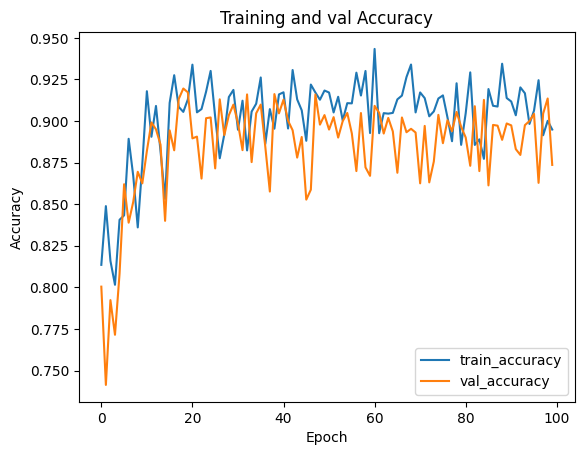

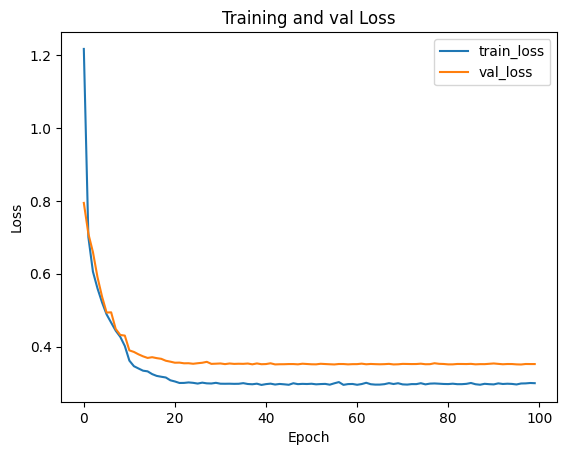

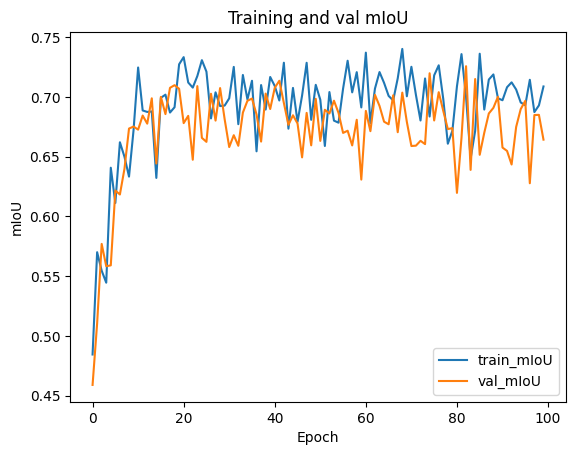

In [ ]:
plt.figure()
plt.plot(train_accuracies, label="train_accuracy")
plt.plot(val_accuracies, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

plt.figure()
plt.plot(train_mIoUs, label="train_mIoU")
plt.plot(val_mIoUs, label="val_mIoU")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Training and val mIoU')

# Evaluation

In [ ]:
best_val_model_path = './Pre-Trained_Models/best_val_checkpoint_norm_aug_tensorboard.pth'
best_val_checkpoint = torch.load(best_val_model_path, map_location=torch.device(device))
# Before loading the state_dict of the model, make sure the "model" instance is 
# initiated by its corresponding class e.g. VGG16
model.load_state_dict(best_val_checkpoint['model'])

<All keys matched successfully>

In [ ]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

t_test = A.Compose([A.Resize(256, 256, interpolation=cv2.INTER_NEAREST)])
test_set = CityDataset(IMAGE_PATH_TEST, MASK_PATH_TEST, X_test, mean, std, t_test)

In [ ]:
def predict_image_mask_miou(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    # t = T.Compose([T.ToTensor(), T.Normalize(mean, std)])
    # image = t(image)
    model.to(device); image=image.to(device)
    mask = mask.to(device)
    with torch.no_grad():
        
        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)
        
        output = model(image)
        score = mIoU(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score

In [ ]:
def test_miou_score(model, test_set):
    score_iou = []
    for i in tqdm(range(len(test_set))):
        img, mask = test_set[i]
        pred_mask, score = predict_image_mask_miou(model, img, mask)
        score_iou.append(score)
    return score_iou

In [ ]:
mob_miou = test_miou_score(model, test_set)
np.mean(mob_miou)

  0%|          | 0/101 [00:00<?, ?it/s]

0.7099671972997781

In [ ]:
def display_for_comparison(image, mask, pred_mask):
  image = image.numpy().transpose(1,2,0)

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
  ax1.imshow(image)
  ax1.set_title('Picture');

  ax2.imshow(mask)
  ax2.set_title('Ground truth')
  ax2.set_axis_off()

  ax3.imshow(pred_mask)
  ax3.set_title('UNet-VGG11 | mIoU {:.3f}'.format(score))
  ax3.set_axis_off()

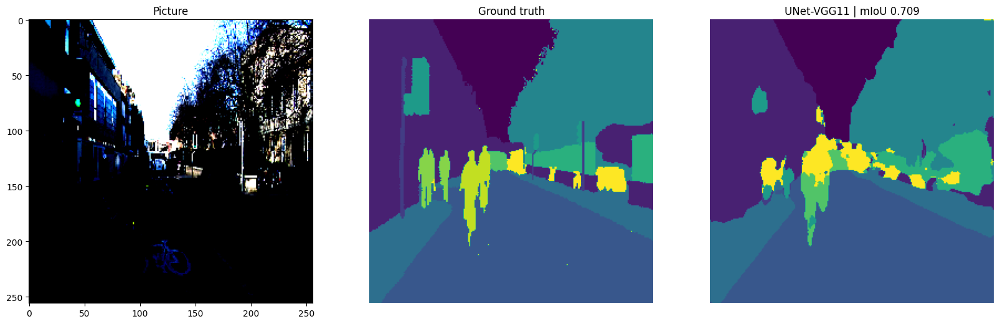

In [ ]:
image, mask = test_set[3]
pred_mask, score = predict_image_mask_miou(model, image, mask)

display_for_comparison(image, mask, pred_mask)

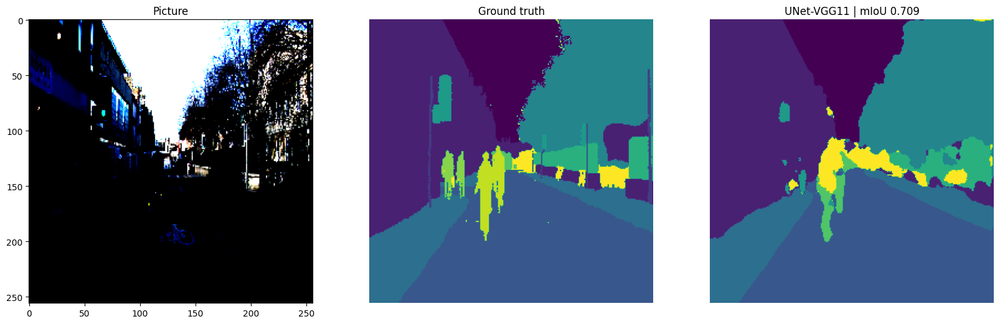

In [ ]:
image2, mask2 = test_set[9]
pred_mask2, score2 = predict_image_mask_miou(model, image2, mask2)


display_for_comparison(image2, mask2, pred_mask2)

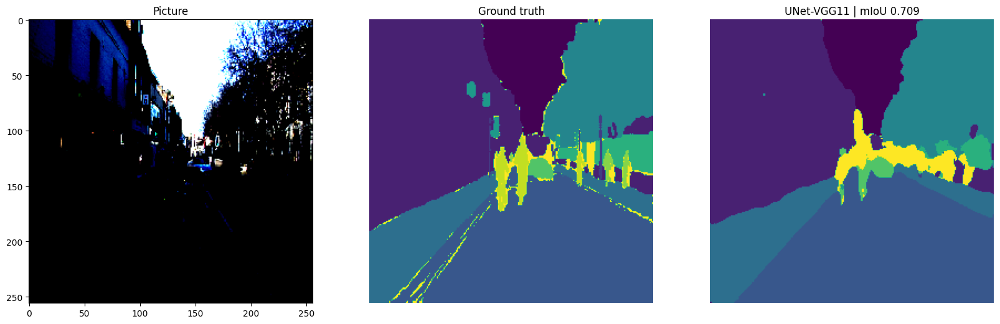

In [ ]:
image3, mask3 = test_set[15]
pred_mask3, score3 = predict_image_mask_miou(model, image3, mask3)


display_for_comparison(image3, mask3, pred_mask3)

#**Task 2: UNet Architecture with (VGG13, VGG19, MobileNet) Backbones**

### UNet

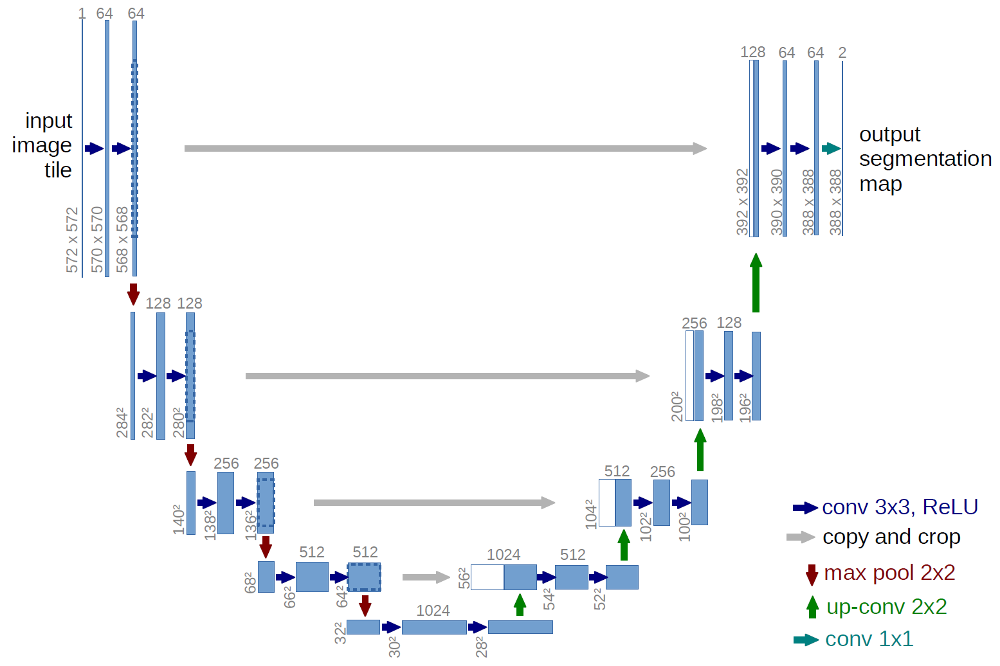

In [123]:
!pip install -q segmentation-models-pytorch

In [124]:
import segmentation_models_pytorch as smp

### Main training loop

### **Training Model 1: VGG13**

In [126]:
model1 = smp.Unet('vgg13', encoder_weights='imagenet', classes=12, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

### Training Configuration

In [128]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model1.parameters(), lr=0.001)

# Define the learning rate scheduler
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Set the number of epochs
# This variable is used in the main training loop
epochs = 100

model1.to(device);

In [129]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracies = []
val_accuracies = []

train_losses = []
val_losses = []

train_mIoUs = []
val_mIoUs = []

val_mIoU_max = -1

checkpoint_path_model1 = '/content/Pre-Trained_Models/vgg13_checkpoint_tensorboard.pth'
best_val_checkpoint_path_model1 = '/content/Pre-Trained_Models/vgg13_best_val_tensorboard.pth'

# Start epoch is zero for new training
start_epoch = 0

In [130]:
!mkdir Pre-Trained_Models

mkdir: cannot create directory ‘Pre-Trained_Models’: File exists


In [131]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch

  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy, train_mIoU  = run_1_epoch(model1, loss_function, train_loader, optimizer, train= True)

  # Update the learning rate scheduler
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_losses.append(train_loss)
  train_accuracies.append(train_accuracy)
  train_mIoUs.append(train_mIoU)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy, val_mIoU  = run_1_epoch(model1, loss_function, val_loader, optimizer, train= False)
  
  # Lists for val loss and accuracy for plotting
  val_losses.append(val_loss)
  val_accuracies.append(val_accuracy)
  val_mIoUs.append(val_mIoU)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  # writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  # writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))
  print('train_IoU %.2f'%(train_mIoU))
  print('val_IoU %.2f'%(val_mIoU))
  
  # Save model if validation accuracy for current epoch is greater than 
  # all the previous epochs 
  if val_mIoU > val_mIoU_max:
    val_mIoU_max = val_mIoU
    print("New max val mean IoU Acheived %.2f. Saving model.\n\n"%(val_mIoU_max))

    checkpoint = {
    'model': model1.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint_path_model1, best_val_checkpoint_path_model1)

  else:
    print("val mean IoU did not increase from %.2f\n\n"%(val_mIoU_max))

  # Save checkpoint for the last epoch
  checkpoint = {
    'model': model1.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint_path_model1, best_val_checkpoint_path_model1)

  

Epoch 0: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 0: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 1.3156
val loss: 1.1082
train_accuracy 0.71
val_accuracy 0.70
train_IoU 0.41
val_IoU 0.43
New max val mean IoU Acheived 0.43. Saving model.


Epoch 1: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.7186
val loss: 0.7312
train_accuracy 0.80
val_accuracy 0.75
train_IoU 0.53
val_IoU 0.45
New max val mean IoU Acheived 0.45. Saving model.


Epoch 2: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5999
val loss: 0.5843
train_accuracy 0.83
val_accuracy 0.80
train_IoU 0.56
val_IoU 0.58
New max val mean IoU Acheived 0.58. Saving model.


Epoch 3: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5520
val loss: 0.5156
train_accuracy 0.84
val_accuracy 0.87
train_IoU 0.58
val_IoU 0.60
New max val mean IoU Acheived 0.60. Saving model.


Epoch 4: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5106
val loss: 0.5172
train_accuracy 0.81
val_accuracy 0.81
train_IoU 0.58
val_IoU 0.59
val mean IoU did not increase from 0.60


Epoch 5: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5012
val loss: 0.5813
train_accuracy 0.83
val_accuracy 0.81
train_IoU 0.65
val_IoU 0.58
val mean IoU did not increase from 0.60


Epoch 6: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4784
val loss: 0.5528
train_accuracy 0.85
val_accuracy 0.82
train_IoU 0.60
val_IoU 0.61
New max val mean IoU Acheived 0.61. Saving model.


Epoch 7: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4303
val loss: 0.4416
train_accuracy 0.91
val_accuracy 0.85
train_IoU 0.69
val_IoU 0.67
New max val mean IoU Acheived 0.67. Saving model.


Epoch 8: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4076
val loss: 0.4410
train_accuracy 0.89
val_accuracy 0.84
train_IoU 0.64
val_IoU 0.62
val mean IoU did not increase from 0.67


Epoch 9: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4276
val loss: 0.4452
train_accuracy 0.87
val_accuracy 0.84
train_IoU 0.65
val_IoU 0.63
val mean IoU did not increase from 0.67


Epoch 10: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3739
val loss: 0.3893
train_accuracy 0.87
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.64
val mean IoU did not increase from 0.67


Epoch 11: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3536
val loss: 0.3810
train_accuracy 0.87
val_accuracy 0.88
train_IoU 0.62
val_IoU 0.67
New max val mean IoU Acheived 0.67. Saving model.


Epoch 12: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3477
val loss: 0.3745
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.68
New max val mean IoU Acheived 0.68. Saving model.


Epoch 13: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3381
val loss: 0.3700
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.67
val_IoU 0.69
New max val mean IoU Acheived 0.69. Saving model.


Epoch 14: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3330
val loss: 0.3665
train_accuracy 0.89
val_accuracy 0.86
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.69


Epoch 15: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3277
val loss: 0.3672
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.69


Epoch 16: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3252
val loss: 0.3601
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 17: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3193
val loss: 0.3613
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 18: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3152
val loss: 0.3598
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 19: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3146
val loss: 0.3530
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 20: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3075
val loss: 0.3517
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 21: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 21: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3064
val loss: 0.3513
train_accuracy 0.93
val_accuracy 0.91
train_IoU 0.72
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 22: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 22: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3063
val loss: 0.3504
train_accuracy 0.91
val_accuracy 0.85
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 23: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 23: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3056
val loss: 0.3521
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.66
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 24: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 24: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3044
val loss: 0.3501
train_accuracy 0.92
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 25: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 25: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3056
val loss: 0.3516
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 26: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 26: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3032
val loss: 0.3499
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 27: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 27: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3079
val loss: 0.3486
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 28: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 28: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3023
val loss: 0.3493
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 29: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 29: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3067
val loss: 0.3505
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.66
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 30: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 30: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3038
val loss: 0.3503
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 31: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 31: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3010
val loss: 0.3497
train_accuracy 0.91
val_accuracy 0.86
train_IoU 0.72
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 32: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 32: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3014
val loss: 0.3500
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 33: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 33: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3009
val loss: 0.3496
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 34: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 34: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3037
val loss: 0.3504
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.66
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 35: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 35: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3008
val loss: 0.3495
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.69
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 36: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 36: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3019
val loss: 0.3499
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 37: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 37: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3008
val loss: 0.3487
train_accuracy 0.93
val_accuracy 0.88
train_IoU 0.73
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 38: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 38: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3009
val loss: 0.3493
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.65
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 39: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 39: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3019
val loss: 0.3488
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 40: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 40: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3005
val loss: 0.3501
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.65
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 41: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 41: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3036
val loss: 0.3493
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.71
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 42: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 42: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2998
val loss: 0.3496
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 43: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 43: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2977
val loss: 0.3486
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.73
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 44: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 44: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2979
val loss: 0.3497
train_accuracy 0.90
val_accuracy 0.86
train_IoU 0.68
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 45: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 45: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2998
val loss: 0.3494
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 46: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 46: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2994
val loss: 0.3488
train_accuracy 0.92
val_accuracy 0.87
train_IoU 0.73
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 47: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 47: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3005
val loss: 0.3489
train_accuracy 0.93
val_accuracy 0.89
train_IoU 0.72
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 48: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 48: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3010
val loss: 0.3494
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.67
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 49: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 49: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3030
val loss: 0.3487
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 50: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 50: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3005
val loss: 0.3499
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 51: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 51: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3035
val loss: 0.3496
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 52: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 52: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3022
val loss: 0.3492
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 53: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 53: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3002
val loss: 0.3499
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 54: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 54: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3027
val loss: 0.3484
train_accuracy 0.89
val_accuracy 0.91
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 55: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 55: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3005
val loss: 0.3488
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 56: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 56: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3003
val loss: 0.3492
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.73
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 57: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 57: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3038
val loss: 0.3494
train_accuracy 0.92
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 58: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 58: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2995
val loss: 0.3484
train_accuracy 0.91
val_accuracy 0.86
train_IoU 0.71
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 59: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 59: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3010
val loss: 0.3494
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 60: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 60: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3030
val loss: 0.3493
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 61: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 61: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2999
val loss: 0.3492
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 62: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 62: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3034
val loss: 0.3489
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.71
val mean IoU did not increase from 0.71


Epoch 63: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 63: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3047
val loss: 0.3492
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 64: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 64: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3017
val loss: 0.3483
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 65: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 65: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3062
val loss: 0.3488
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 66: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 66: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3003
val loss: 0.3491
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 67: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 67: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3038
val loss: 0.3484
train_accuracy 0.94
val_accuracy 0.89
train_IoU 0.73
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 68: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 68: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3020
val loss: 0.3488
train_accuracy 0.92
val_accuracy 0.92
train_IoU 0.72
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 69: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 69: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3033
val loss: 0.3500
train_accuracy 0.92
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 70: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 70: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3035
val loss: 0.3493
train_accuracy 0.90
val_accuracy 0.91
train_IoU 0.68
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 71: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 71: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3017
val loss: 0.3487
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 72: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 72: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3001
val loss: 0.3488
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 73: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 73: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3008
val loss: 0.3489
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.72
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 74: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 74: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3014
val loss: 0.3486
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 75: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 75: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3006
val loss: 0.3496
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 76: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 76: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3020
val loss: 0.3498
train_accuracy 0.89
val_accuracy 0.92
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 77: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 77: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2977
val loss: 0.3490
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 78: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 78: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3024
val loss: 0.3493
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 79: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 79: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2985
val loss: 0.3489
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 80: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 80: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2995
val loss: 0.3488
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 81: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 81: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3002
val loss: 0.3495
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.67
val_IoU 0.64
val mean IoU did not increase from 0.71


Epoch 82: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 82: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3028
val loss: 0.3495
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 83: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 83: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3000
val loss: 0.3501
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 84: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 84: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3003
val loss: 0.3498
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 85: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 85: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2998
val loss: 0.3499
train_accuracy 0.88
val_accuracy 0.91
train_IoU 0.62
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 86: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 86: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3010
val loss: 0.3499
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.72
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 87: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 87: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3017
val loss: 0.3491
train_accuracy 0.92
val_accuracy 0.91
train_IoU 0.71
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 88: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 88: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3013
val loss: 0.3490
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 89: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 89: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3022
val loss: 0.3488
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 90: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 90: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3023
val loss: 0.3489
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 91: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 91: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3016
val loss: 0.3490
train_accuracy 0.89
val_accuracy 0.86
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 92: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 92: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3006
val loss: 0.3491
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 93: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 93: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3012
val loss: 0.3488
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 94: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 94: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3018
val loss: 0.3495
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 95: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 95: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.2988
val loss: 0.3493
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 96: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 96: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3018
val loss: 0.3485
train_accuracy 0.91
val_accuracy 0.92
train_IoU 0.72
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 97: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 97: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3039
val loss: 0.3488
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 98: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 98: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3039
val loss: 0.3487
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 99: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 99: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3043
val loss: 0.3487
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.71




Text(0.5, 1.0, 'Training and val mIoU')

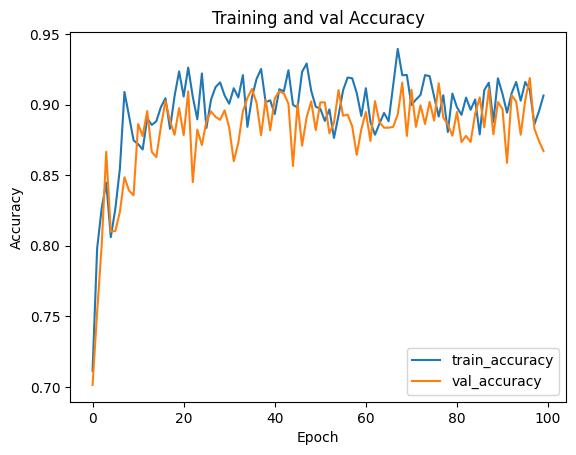

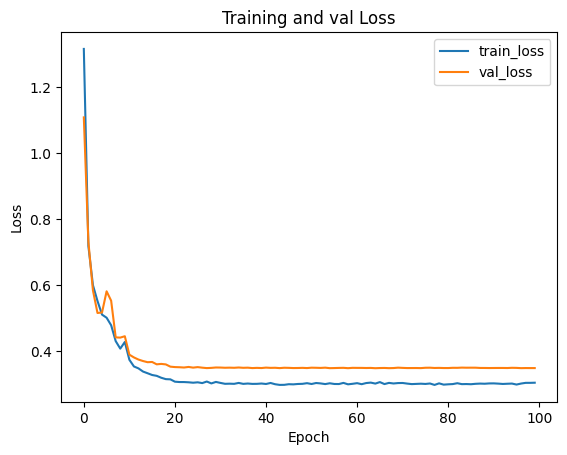

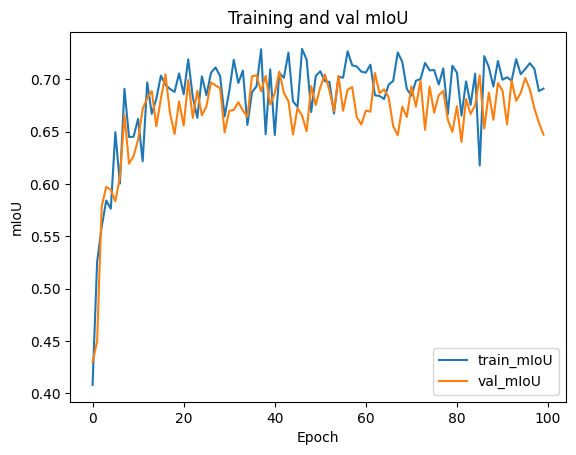

In [132]:
plt.figure()
plt.plot(train_accuracies, label="train_accuracy")
plt.plot(val_accuracies, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

plt.figure()
plt.plot(train_mIoUs, label="train_mIoU")
plt.plot(val_mIoUs, label="val_mIoU")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Training and val mIoU')

### **Training Model 2: VGG19**

In [133]:
model2 = smp.Unet('vgg19', encoder_weights='imagenet', classes=12, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

### Training Configuration

In [134]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model2.parameters(), lr=0.001)

# Define the learning rate scheduler
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Set the number of epochs
# This variable is used in the main training loop
epochs = 100

model2.to(device);

In [135]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracies = []
val_accuracies = []

train_losses = []
val_losses = []

train_mIoUs = []
val_mIoUs = []

val_mIoU_max = -1

checkpoint_path_model2 = '/content/Pre-Trained_Models/vgg19_checkpoint_tensorboard.pth'
best_val_checkpoint_path_model2 = '/content/Pre-Trained_Models/vgg19_best_val_tensorboard.pth'

# Start epoch is zero for new training
start_epoch = 0

In [136]:
!mkdir Pre-Trained_Models

mkdir: cannot create directory ‘Pre-Trained_Models’: File exists


In [137]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch

  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy, train_mIoU  = run_1_epoch(model2, loss_function, train_loader, optimizer, train= True)

  # Update the learning rate scheduler
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_losses.append(train_loss)
  train_accuracies.append(train_accuracy)
  train_mIoUs.append(train_mIoU)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy, val_mIoU  = run_1_epoch(model2, loss_function, val_loader, optimizer, train= False)
  
  # Lists for val loss and accuracy for plotting
  val_losses.append(val_loss)
  val_accuracies.append(val_accuracy)
  val_mIoUs.append(val_mIoU)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  # writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  # writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))
  print('train_IoU %.2f'%(train_mIoU))
  print('val_IoU %.2f'%(val_mIoU))
  
  # Save model if validation accuracy for current epoch is greater than 
  # all the previous epochs 
  if val_mIoU > val_mIoU_max:
    val_mIoU_max = val_mIoU
    print("New max val mean IoU Acheived %.2f. Saving model.\n\n"%(val_mIoU_max))

    checkpoint = {
    'model': model2.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint_path_model2, best_val_checkpoint_path_model2)

  else:
    print("val mean IoU did not increase from %.2f\n\n"%(val_mIoU_max))

  # Save checkpoint for the last epoch
  checkpoint = {
    'model': model2.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint_path_model2, best_val_checkpoint_path_model2)

  

Epoch 0: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 0: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 1.2716
val loss: 0.9222
train_accuracy 0.74
val_accuracy 0.71
train_IoU 0.44
val_IoU 0.39
New max val mean IoU Acheived 0.39. Saving model.


Epoch 1: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.7922
val loss: 0.7205
train_accuracy 0.79
val_accuracy 0.78
train_IoU 0.52
val_IoU 0.48
New max val mean IoU Acheived 0.48. Saving model.


Epoch 2: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.6776
val loss: 0.7722
train_accuracy 0.74
val_accuracy 0.78
train_IoU 0.45
val_IoU 0.45
val mean IoU did not increase from 0.48


Epoch 3: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5950
val loss: 0.6840
train_accuracy 0.82
val_accuracy 0.81
train_IoU 0.57
val_IoU 0.46
val mean IoU did not increase from 0.48


Epoch 4: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5946
val loss: 0.7977
train_accuracy 0.80
val_accuracy 0.72
train_IoU 0.55
val_IoU 0.53
New max val mean IoU Acheived 0.53. Saving model.


Epoch 5: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5375
val loss: 0.6004
train_accuracy 0.82
val_accuracy 0.84
train_IoU 0.61
val_IoU 0.59
New max val mean IoU Acheived 0.59. Saving model.


Epoch 6: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4972
val loss: 0.5772
train_accuracy 0.87
val_accuracy 0.78
train_IoU 0.63
val_IoU 0.53
val mean IoU did not increase from 0.59


Epoch 7: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4719
val loss: 0.6169
train_accuracy 0.83
val_accuracy 0.86
train_IoU 0.59
val_IoU 0.64
New max val mean IoU Acheived 0.64. Saving model.


Epoch 8: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4544
val loss: 0.4632
train_accuracy 0.87
val_accuracy 0.84
train_IoU 0.65
val_IoU 0.61
val mean IoU did not increase from 0.64


Epoch 9: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4466
val loss: 0.4860
train_accuracy 0.85
val_accuracy 0.88
train_IoU 0.61
val_IoU 0.63
val mean IoU did not increase from 0.64


Epoch 10: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4089
val loss: 0.4240
train_accuracy 0.89
val_accuracy 0.84
train_IoU 0.66
val_IoU 0.61
val mean IoU did not increase from 0.64


Epoch 11: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3848
val loss: 0.4158
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.66
New max val mean IoU Acheived 0.66. Saving model.


Epoch 12: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3775
val loss: 0.4076
train_accuracy 0.88
val_accuracy 0.86
train_IoU 0.68
val_IoU 0.63
val mean IoU did not increase from 0.66


Epoch 13: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3749
val loss: 0.4035
train_accuracy 0.85
val_accuracy 0.87
train_IoU 0.64
val_IoU 0.64
val mean IoU did not increase from 0.66


Epoch 14: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3748
val loss: 0.4025
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.66
New max val mean IoU Acheived 0.66. Saving model.


Epoch 15: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3664
val loss: 0.3945
train_accuracy 0.87
val_accuracy 0.88
train_IoU 0.67
val_IoU 0.68
New max val mean IoU Acheived 0.68. Saving model.


Epoch 16: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3668
val loss: 0.3986
train_accuracy 0.86
val_accuracy 0.87
train_IoU 0.65
val_IoU 0.66
val mean IoU did not increase from 0.68


Epoch 17: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3579
val loss: 0.3906
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.71
val_IoU 0.69
New max val mean IoU Acheived 0.69. Saving model.


Epoch 18: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3544
val loss: 0.4006
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.69


Epoch 19: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3510
val loss: 0.3847
train_accuracy 0.89
val_accuracy 0.86
train_IoU 0.65
val_IoU 0.63
val mean IoU did not increase from 0.69


Epoch 20: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3439
val loss: 0.3845
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 21: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 21: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3458
val loss: 0.3848
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.65
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 22: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 22: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3434
val loss: 0.3848
train_accuracy 0.87
val_accuracy 0.86
train_IoU 0.65
val_IoU 0.64
val mean IoU did not increase from 0.70


Epoch 23: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 23: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3441
val loss: 0.3818
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 24: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 24: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3411
val loss: 0.3833
train_accuracy 0.86
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 25: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 25: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3385
val loss: 0.3818
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 26: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 26: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3376
val loss: 0.3797
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 27: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 27: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3376
val loss: 0.3805
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.70
val_IoU 0.62
val mean IoU did not increase from 0.70


Epoch 28: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 28: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3353
val loss: 0.3804
train_accuracy 0.88
val_accuracy 0.88
train_IoU 0.65
val_IoU 0.64
val mean IoU did not increase from 0.70


Epoch 29: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 29: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3372
val loss: 0.3812
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.65
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 30: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 30: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3390
val loss: 0.3811
train_accuracy 0.88
val_accuracy 0.84
train_IoU 0.68
val_IoU 0.61
val mean IoU did not increase from 0.70


Epoch 31: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 31: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3385
val loss: 0.3800
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 32: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 32: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3346
val loss: 0.3802
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 33: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 33: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3373
val loss: 0.3796
train_accuracy 0.90
val_accuracy 0.86
train_IoU 0.69
val_IoU 0.62
val mean IoU did not increase from 0.70


Epoch 34: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 34: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3384
val loss: 0.3796
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 35: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 35: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3351
val loss: 0.3788
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 36: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 36: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3391
val loss: 0.3787
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 37: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 37: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3364
val loss: 0.3801
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 38: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 38: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3365
val loss: 0.3794
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.68
val_IoU 0.63
val mean IoU did not increase from 0.70


Epoch 39: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 39: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3379
val loss: 0.3799
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 40: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 40: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3389
val loss: 0.3815
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 41: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 41: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3378
val loss: 0.3794
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 42: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 42: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3381
val loss: 0.3803
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 43: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 43: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3401
val loss: 0.3791
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 44: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 44: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3358
val loss: 0.3789
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 45: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 45: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3357
val loss: 0.3825
train_accuracy 0.87
val_accuracy 0.91
train_IoU 0.65
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 46: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 46: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3375
val loss: 0.3803
train_accuracy 0.86
val_accuracy 0.88
train_IoU 0.66
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 47: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 47: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3784
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 48: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 48: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3351
val loss: 0.3791
train_accuracy 0.90
val_accuracy 0.86
train_IoU 0.67
val_IoU 0.64
val mean IoU did not increase from 0.70


Epoch 49: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 49: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3378
val loss: 0.3816
train_accuracy 0.88
val_accuracy 0.85
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 50: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 50: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3806
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 51: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 51: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3385
val loss: 0.3807
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.66
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 52: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 52: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3382
val loss: 0.3788
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 53: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 53: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3814
train_accuracy 0.88
val_accuracy 0.88
train_IoU 0.65
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 54: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 54: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3365
val loss: 0.3791
train_accuracy 0.87
val_accuracy 0.88
train_IoU 0.66
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 55: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 55: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3367
val loss: 0.3807
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 56: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 56: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3361
val loss: 0.3796
train_accuracy 0.89
val_accuracy 0.86
train_IoU 0.67
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 57: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 57: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3373
val loss: 0.3800
train_accuracy 0.86
val_accuracy 0.89
train_IoU 0.64
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 58: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 58: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3365
val loss: 0.3801
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 59: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 59: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3375
val loss: 0.3786
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 60: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 60: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3358
val loss: 0.3807
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 61: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 61: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3368
val loss: 0.3790
train_accuracy 0.92
val_accuracy 0.84
train_IoU 0.69
val_IoU 0.63
val mean IoU did not increase from 0.70


Epoch 62: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 62: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3364
val loss: 0.3794
train_accuracy 0.88
val_accuracy 0.87
train_IoU 0.64
val_IoU 0.63
val mean IoU did not increase from 0.70


Epoch 63: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 63: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3344
val loss: 0.3811
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 64: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 64: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3358
val loss: 0.3799
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 65: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 65: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3374
val loss: 0.3797
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.61
val mean IoU did not increase from 0.70


Epoch 66: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 66: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3369
val loss: 0.3795
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.71
val_IoU 0.61
val mean IoU did not increase from 0.70


Epoch 67: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 67: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3372
val loss: 0.3789
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 68: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 68: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3391
val loss: 0.3801
train_accuracy 0.86
val_accuracy 0.87
train_IoU 0.61
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 69: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 69: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3808
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 70: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 70: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3361
val loss: 0.3798
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 71: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 71: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3360
val loss: 0.3808
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 72: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 72: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3380
val loss: 0.3798
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 73: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 73: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3366
val loss: 0.3810
train_accuracy 0.87
val_accuracy 0.89
train_IoU 0.65
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 74: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 74: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3819
train_accuracy 0.88
val_accuracy 0.88
train_IoU 0.65
val_IoU 0.64
val mean IoU did not increase from 0.70


Epoch 75: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 75: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3361
val loss: 0.3796
train_accuracy 0.84
val_accuracy 0.88
train_IoU 0.63
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 76: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 76: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3373
val loss: 0.3793
train_accuracy 0.89
val_accuracy 0.84
train_IoU 0.67
val_IoU 0.61
val mean IoU did not increase from 0.70


Epoch 77: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 77: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3359
val loss: 0.3788
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 78: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 78: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3365
val loss: 0.3805
train_accuracy 0.87
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 79: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 79: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3376
val loss: 0.3803
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 80: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 80: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3355
val loss: 0.3815
train_accuracy 0.88
val_accuracy 0.91
train_IoU 0.65
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 81: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 81: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3404
val loss: 0.3789
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 82: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 82: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3802
train_accuracy 0.85
val_accuracy 0.87
train_IoU 0.63
val_IoU 0.64
val mean IoU did not increase from 0.70


Epoch 83: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 83: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3364
val loss: 0.3811
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.62
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 84: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 84: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3417
val loss: 0.3786
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 85: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 85: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3370
val loss: 0.3801
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 86: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 86: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3383
val loss: 0.3796
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 87: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 87: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3378
val loss: 0.3814
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.67
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 88: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 88: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3364
val loss: 0.3803
train_accuracy 0.88
val_accuracy 0.91
train_IoU 0.65
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 89: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 89: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3378
val loss: 0.3805
train_accuracy 0.87
val_accuracy 0.87
train_IoU 0.62
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 90: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 90: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3405
val loss: 0.3794
train_accuracy 0.89
val_accuracy 0.92
train_IoU 0.69
val_IoU 0.71
val mean IoU did not increase from 0.71


Epoch 91: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 91: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3352
val loss: 0.3787
train_accuracy 0.90
val_accuracy 0.91
train_IoU 0.66
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 92: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 92: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3374
val loss: 0.3796
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 93: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 93: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3390
val loss: 0.3799
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.63
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 94: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 94: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3399
val loss: 0.3815
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.62
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 95: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 95: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3346
val loss: 0.3789
train_accuracy 0.91
val_accuracy 0.85
train_IoU 0.72
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 96: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 96: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3373
val loss: 0.3793
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 97: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 97: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3373
val loss: 0.3791
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 98: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 98: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3407
val loss: 0.3802
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 99: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 99: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3341
val loss: 0.3794
train_accuracy 0.86
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.65
val mean IoU did not increase from 0.71




Text(0.5, 1.0, 'Training and val mIoU')

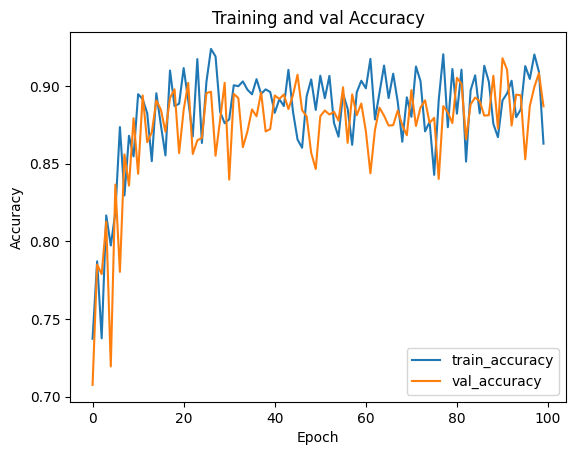

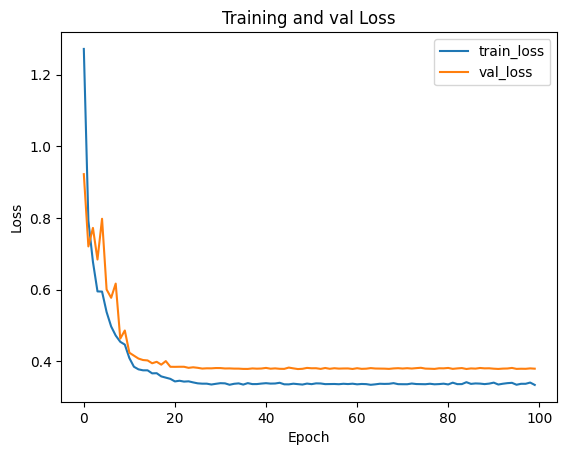

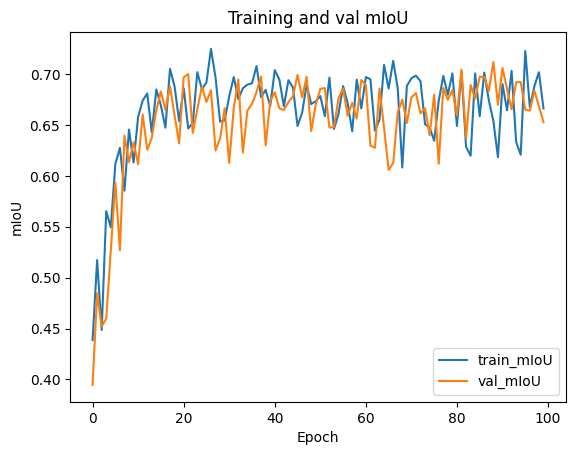

In [138]:
plt.figure()
plt.plot(train_accuracies, label="train_accuracy")
plt.plot(val_accuracies, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

plt.figure()
plt.plot(train_mIoUs, label="train_mIoU")
plt.plot(val_mIoUs, label="val_mIoU")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Training and val mIoU')

### **Training Model 3: MobileNet**

In [140]:
model3 = smp.Unet('mobilenet_v2', encoder_weights='imagenet', classes=12, activation=None, encoder_depth=5, decoder_channels=[256, 128, 64, 32, 16])

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 117MB/s]


### Training Configuration

In [141]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model3.parameters(), lr=0.001)

# Define the learning rate scheduler
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

# Set the number of epochs
# This variable is used in the main training loop
epochs = 100

model3.to(device);

In [142]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracies = []
val_accuracies = []

train_losses = []
val_losses = []

train_mIoUs = []
val_mIoUs = []

val_mIoU_max = -1

checkpoint_path_model3 = '/content/Pre-Trained_Models/mobilenet_checkpoint_tensorboard.pth'
best_val_checkpoint_path_model3 = '/content/Pre-Trained_Models/mobilenet_best_val_tensorboard.pth'

# Start epoch is zero for new training
start_epoch = 0

In [143]:
!mkdir Pre-Trained_Models

mkdir: cannot create directory ‘Pre-Trained_Models’: File exists


In [144]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch

  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy, train_mIoU  = run_1_epoch(model3, loss_function, train_loader, optimizer, train= True)

  # Update the learning rate scheduler
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_losses.append(train_loss)
  train_accuracies.append(train_accuracy)
  train_mIoUs.append(train_mIoU)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy, val_mIoU  = run_1_epoch(model3, loss_function, val_loader, optimizer, train= False)
  
  # Lists for val loss and accuracy for plotting
  val_losses.append(val_loss)
  val_accuracies.append(val_accuracy)
  val_mIoUs.append(val_mIoU)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  # writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  # writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))
  print('train_IoU %.2f'%(train_mIoU))
  print('val_IoU %.2f'%(val_mIoU))
  
  # Save model if validation accuracy for current epoch is greater than 
  # all the previous epochs 
  if val_mIoU > val_mIoU_max:
    val_mIoU_max = val_mIoU
    print("New max val mean IoU Acheived %.2f. Saving model.\n\n"%(val_mIoU_max))

    checkpoint = {
    'model': model3.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint_path_model3, best_val_checkpoint_path_model3)

  else:
    print("val mean IoU did not increase from %.2f\n\n"%(val_mIoU_max))

  # Save checkpoint for the last epoch
  checkpoint = {
    'model': model3.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint_path_model3, best_val_checkpoint_path_model3)

  

Epoch 0: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 0: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 1.3523
val loss: 0.9053
train_accuracy 0.79
val_accuracy 0.76
train_IoU 0.48
val_IoU 0.46
New max val mean IoU Acheived 0.46. Saving model.


Epoch 1: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 1: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.7474
val loss: 0.8184
train_accuracy 0.81
val_accuracy 0.74
train_IoU 0.53
val_IoU 0.46
val mean IoU did not increase from 0.46


Epoch 2: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 2: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.6113
val loss: 0.6211
train_accuracy 0.82
val_accuracy 0.80
train_IoU 0.50
val_IoU 0.54
New max val mean IoU Acheived 0.54. Saving model.


Epoch 3: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 3: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5747
val loss: 0.5790
train_accuracy 0.81
val_accuracy 0.80
train_IoU 0.57
val_IoU 0.54
val mean IoU did not increase from 0.54


Epoch 4: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 4: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5277
val loss: 0.5031
train_accuracy 0.83
val_accuracy 0.85
train_IoU 0.60
val_IoU 0.64
New max val mean IoU Acheived 0.64. Saving model.


Epoch 5: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 5: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.5032
val loss: 0.5210
train_accuracy 0.84
val_accuracy 0.85
train_IoU 0.60
val_IoU 0.64
val mean IoU did not increase from 0.64


Epoch 6: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 6: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4864
val loss: 0.4779
train_accuracy 0.84
val_accuracy 0.82
train_IoU 0.58
val_IoU 0.57
val mean IoU did not increase from 0.64


Epoch 7: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 7: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4555
val loss: 0.5070
train_accuracy 0.85
val_accuracy 0.86
train_IoU 0.61
val_IoU 0.57
val mean IoU did not increase from 0.64


Epoch 8: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 8: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4602
val loss: 0.4587
train_accuracy 0.90
val_accuracy 0.85
train_IoU 0.68
val_IoU 0.65
New max val mean IoU Acheived 0.65. Saving model.


Epoch 9: Train 
Learning Rate: 0.001000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 9: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4773
val loss: 0.4660
train_accuracy 0.80
val_accuracy 0.87
train_IoU 0.57
val_IoU 0.62
val mean IoU did not increase from 0.65


Epoch 10: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 10: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.4196
val loss: 0.4091
train_accuracy 0.88
val_accuracy 0.87
train_IoU 0.65
val_IoU 0.67
New max val mean IoU Acheived 0.67. Saving model.


Epoch 11: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 11: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3937
val loss: 0.4025
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.67
New max val mean IoU Acheived 0.67. Saving model.


Epoch 12: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 12: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3914
val loss: 0.3964
train_accuracy 0.86
val_accuracy 0.88
train_IoU 0.66
val_IoU 0.67
New max val mean IoU Acheived 0.67. Saving model.


Epoch 13: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 13: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3829
val loss: 0.3885
train_accuracy 0.83
val_accuracy 0.88
train_IoU 0.62
val_IoU 0.64
val mean IoU did not increase from 0.67


Epoch 14: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 14: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3731
val loss: 0.3854
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.63
val_IoU 0.66
val mean IoU did not increase from 0.67


Epoch 15: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 15: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3715
val loss: 0.3785
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.64
val mean IoU did not increase from 0.67


Epoch 16: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 16: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3660
val loss: 0.3822
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.64
val mean IoU did not increase from 0.67


Epoch 17: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 17: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3620
val loss: 0.3756
train_accuracy 0.90
val_accuracy 0.91
train_IoU 0.69
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 18: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 18: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3515
val loss: 0.3723
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 19: Train 
Learning Rate: 0.000100


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 19: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3488
val loss: 0.3695
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.63
val mean IoU did not increase from 0.70


Epoch 20: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 20: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3464
val loss: 0.3688
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 21: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 21: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3484
val loss: 0.3692
train_accuracy 0.92
val_accuracy 0.86
train_IoU 0.70
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 22: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 22: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3560
val loss: 0.3674
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 23: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 23: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3488
val loss: 0.3697
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.64
val_IoU 0.69
val mean IoU did not increase from 0.70


Epoch 24: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 24: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3459
val loss: 0.3672
train_accuracy 0.87
val_accuracy 0.92
train_IoU 0.66
val_IoU 0.70
New max val mean IoU Acheived 0.70. Saving model.


Epoch 25: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 25: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3502
val loss: 0.3712
train_accuracy 0.89
val_accuracy 0.91
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 26: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 26: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3467
val loss: 0.3669
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 27: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 27: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3465
val loss: 0.3666
train_accuracy 0.88
val_accuracy 0.87
train_IoU 0.67
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 28: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 28: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3394
val loss: 0.3672
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.67
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 29: Train 
Learning Rate: 0.000010


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 29: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3434
val loss: 0.3658
train_accuracy 0.88
val_accuracy 0.86
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 30: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 30: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3418
val loss: 0.3670
train_accuracy 0.86
val_accuracy 0.91
train_IoU 0.64
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 31: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 31: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3387
val loss: 0.3653
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.67
val_IoU 0.61
val mean IoU did not increase from 0.70


Epoch 32: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 32: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3440
val loss: 0.3657
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.70
val mean IoU did not increase from 0.70


Epoch 33: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 33: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3397
val loss: 0.3670
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.67
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 34: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 34: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3470
val loss: 0.3644
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.65
val mean IoU did not increase from 0.70


Epoch 35: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 35: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3404
val loss: 0.3646
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.66
val_IoU 0.68
val mean IoU did not increase from 0.70


Epoch 36: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 36: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3496
val loss: 0.3659
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.70


Epoch 37: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 37: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3417
val loss: 0.3653
train_accuracy 0.87
val_accuracy 0.91
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.70


Epoch 38: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 38: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3459
val loss: 0.3675
train_accuracy 0.87
val_accuracy 0.90
train_IoU 0.61
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 39: Train 
Learning Rate: 0.000001


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 39: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3396
val loss: 0.3651
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 40: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 40: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3433
val loss: 0.3666
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.72
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 41: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 41: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3416
val loss: 0.3653
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 42: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 42: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3394
val loss: 0.3659
train_accuracy 0.89
val_accuracy 0.85
train_IoU 0.69
val_IoU 0.59
val mean IoU did not increase from 0.71


Epoch 43: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 43: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3402
val loss: 0.3656
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 44: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 44: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3402
val loss: 0.3660
train_accuracy 0.85
val_accuracy 0.89
train_IoU 0.64
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 45: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 45: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3443
val loss: 0.3643
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 46: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 46: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3392
val loss: 0.3658
train_accuracy 0.89
val_accuracy 0.87
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 47: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 47: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3447
val loss: 0.3649
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 48: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 48: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3395
val loss: 0.3656
train_accuracy 0.87
val_accuracy 0.88
train_IoU 0.65
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 49: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 49: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3381
val loss: 0.3642
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 50: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 50: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3456
val loss: 0.3647
train_accuracy 0.88
val_accuracy 0.88
train_IoU 0.62
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 51: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 51: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3438
val loss: 0.3645
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.67
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 52: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 52: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3445
val loss: 0.3649
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.72
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 53: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 53: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3395
val loss: 0.3648
train_accuracy 0.91
val_accuracy 0.92
train_IoU 0.67
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 54: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 54: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3397
val loss: 0.3661
train_accuracy 0.87
val_accuracy 0.86
train_IoU 0.62
val_IoU 0.64
val mean IoU did not increase from 0.71


Epoch 55: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 55: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3400
val loss: 0.3654
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 56: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 56: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3419
val loss: 0.3651
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.63
val mean IoU did not increase from 0.71


Epoch 57: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 57: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3441
val loss: 0.3668
train_accuracy 0.87
val_accuracy 0.89
train_IoU 0.65
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 58: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 58: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3354
val loss: 0.3657
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 59: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 59: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3431
val loss: 0.3637
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 60: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 60: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3462
val loss: 0.3653
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.67
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 61: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 61: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3424
val loss: 0.3645
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.71
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 62: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 62: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3440
val loss: 0.3652
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 63: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 63: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3402
val loss: 0.3654
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 64: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 64: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3418
val loss: 0.3652
train_accuracy 0.89
val_accuracy 0.91
train_IoU 0.70
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 65: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 65: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3437
val loss: 0.3656
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 66: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 66: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3411
val loss: 0.3642
train_accuracy 0.87
val_accuracy 0.90
train_IoU 0.66
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 67: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 67: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3363
val loss: 0.3657
train_accuracy 0.89
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 68: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 68: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3409
val loss: 0.3652
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.64
val mean IoU did not increase from 0.71


Epoch 69: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 69: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3405
val loss: 0.3645
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.67
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 70: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 70: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3403
val loss: 0.3644
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.70
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 71: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 71: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3388
val loss: 0.3657
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 72: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 72: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3417
val loss: 0.3657
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.71
val_IoU 0.62
val mean IoU did not increase from 0.71


Epoch 73: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 73: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3370
val loss: 0.3658
train_accuracy 0.92
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 74: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 74: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3353
val loss: 0.3652
train_accuracy 0.90
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 75: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 75: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3420
val loss: 0.3654
train_accuracy 0.92
val_accuracy 0.87
train_IoU 0.70
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 76: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 76: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3428
val loss: 0.3655
train_accuracy 0.92
val_accuracy 0.89
train_IoU 0.70
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 77: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 77: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3449
val loss: 0.3656
train_accuracy 0.89
val_accuracy 0.91
train_IoU 0.67
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 78: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 78: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3400
val loss: 0.3664
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 79: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 79: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3404
val loss: 0.3653
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.66
val_IoU 0.64
val mean IoU did not increase from 0.71


Epoch 80: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 80: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3397
val loss: 0.3657
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.68
val mean IoU did not increase from 0.71


Epoch 81: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 81: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3404
val loss: 0.3653
train_accuracy 0.92
val_accuracy 0.90
train_IoU 0.64
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 82: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 82: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3386
val loss: 0.3655
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.70
val_IoU 0.71
New max val mean IoU Acheived 0.71. Saving model.


Epoch 83: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 83: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3398
val loss: 0.3649
train_accuracy 0.90
val_accuracy 0.88
train_IoU 0.69
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 84: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 84: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3415
val loss: 0.3649
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.67
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 85: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 85: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3433
val loss: 0.3644
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.66
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 86: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 86: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3403
val loss: 0.3658
train_accuracy 0.90
val_accuracy 0.85
train_IoU 0.68
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 87: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 87: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3398
val loss: 0.3648
train_accuracy 0.90
val_accuracy 0.89
train_IoU 0.69
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 88: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 88: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3379
val loss: 0.3649
train_accuracy 0.87
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 89: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 89: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3379
val loss: 0.3649
train_accuracy 0.87
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 90: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 90: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3434
val loss: 0.3652
train_accuracy 0.89
val_accuracy 0.88
train_IoU 0.68
val_IoU 0.65
val mean IoU did not increase from 0.71


Epoch 91: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 91: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3421
val loss: 0.3670
train_accuracy 0.88
val_accuracy 0.90
train_IoU 0.69
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 92: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 92: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3441
val loss: 0.3655
train_accuracy 0.91
val_accuracy 0.89
train_IoU 0.67
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 93: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 93: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3416
val loss: 0.3650
train_accuracy 0.91
val_accuracy 0.90
train_IoU 0.68
val_IoU 0.70
val mean IoU did not increase from 0.71


Epoch 94: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 94: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3397
val loss: 0.3651
train_accuracy 0.88
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.66
val mean IoU did not increase from 0.71


Epoch 95: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 95: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3392
val loss: 0.3655
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.68
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 96: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 96: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3424
val loss: 0.3673
train_accuracy 0.84
val_accuracy 0.91
train_IoU 0.57
val_IoU 0.69
val mean IoU did not increase from 0.71


Epoch 97: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 97: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3415
val loss: 0.3649
train_accuracy 0.91
val_accuracy 0.88
train_IoU 0.71
val_IoU 0.67
val mean IoU did not increase from 0.71


Epoch 98: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 98: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3389
val loss: 0.3647
train_accuracy 0.90
val_accuracy 0.87
train_IoU 0.68
val_IoU 0.64
val mean IoU did not increase from 0.71


Epoch 99: Train 
Learning Rate: 0.000000


  0%|          | 0/39 [00:00<?, ?it/s]

Epoch 99: Validation


  0%|          | 0/7 [00:00<?, ?it/s]

train loss: 0.3418
val loss: 0.3673
train_accuracy 0.88
val_accuracy 0.88
train_IoU 0.65
val_IoU 0.66
val mean IoU did not increase from 0.71




Text(0.5, 1.0, 'Training and val mIoU')

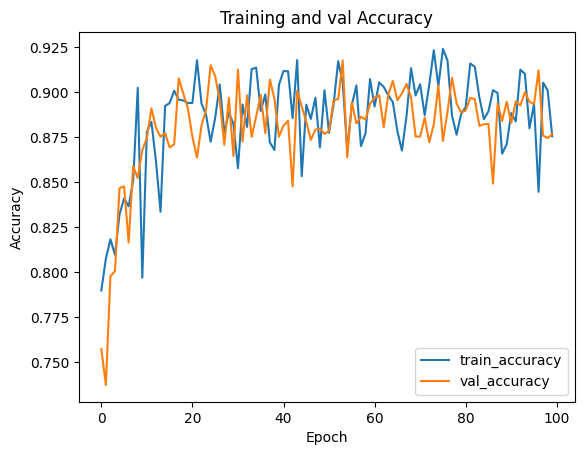

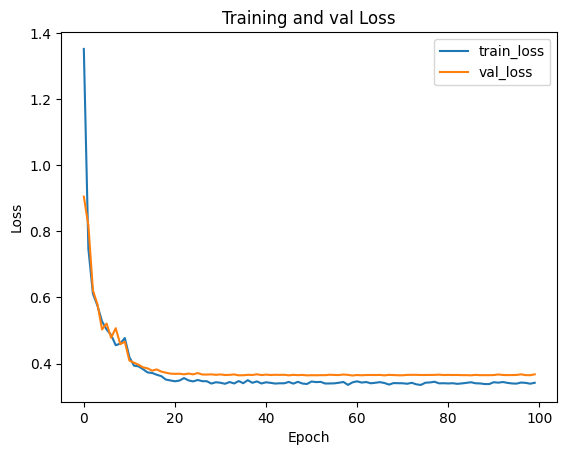

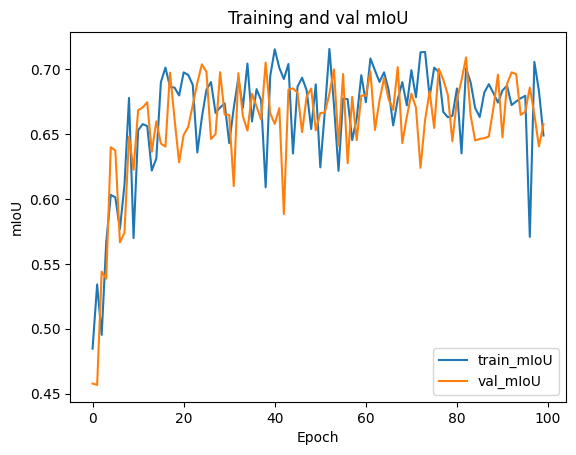

In [145]:
plt.figure()
plt.plot(train_accuracies, label="train_accuracy")
plt.plot(val_accuracies, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

plt.figure()
plt.plot(train_mIoUs, label="train_mIoU")
plt.plot(val_mIoUs, label="val_mIoU")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Training and val mIoU')